# End to End Multi-Class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow.

# 1. Problem
Identifying the dog breed given the image of a dog.

# 2. Data
The data used is from Kaggle

# 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

# 4. Features
* We're dealing with images (unstructured data) , so we're using Deep Learning.
* 120 breeds for dogs. (Multi-Class Classification)
* There are 10,000+ images in training set (Having labels)
* There are 10,000+ images in test set ( Without labels ), as we need to predict labels_

In [ ]:
# !unzip "/content/drive/MyDrive/Dog_Breed/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog_Breed/dog-breed-identification"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
# Import TensorFlow
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ",tf.__version__)
print("TF Hub Version: ",hub.__version__)

TF version:  2.12.0
TF Hub Version:  0.13.0


In [2]:
# Check for GPU Availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


## Getting our data ready ( turning into tensors )


In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog_Breed/dog-breed-identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

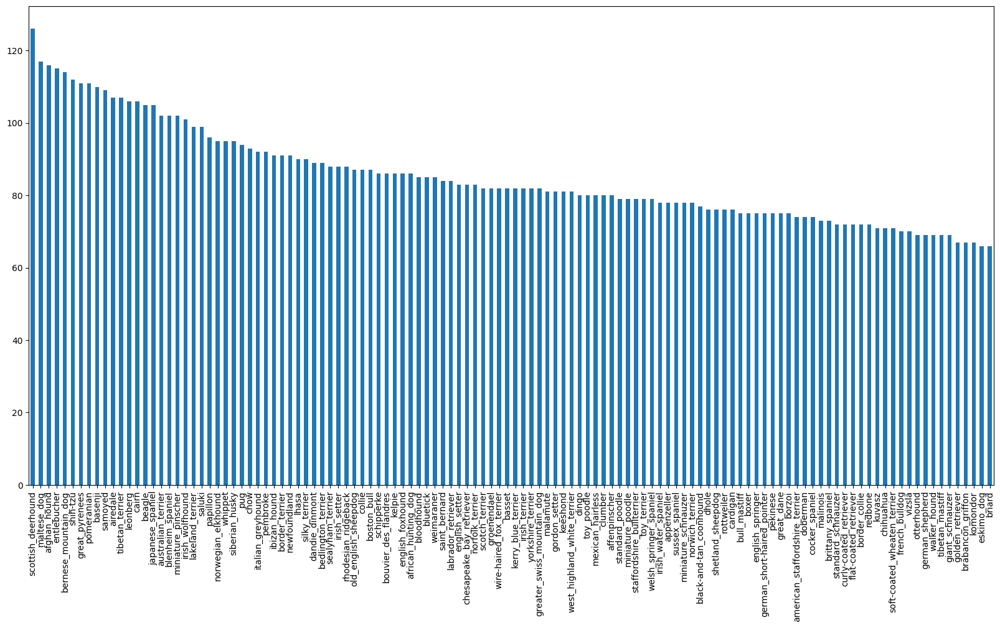

In [4]:
# Plot a graph describing how many images there are for each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [5]:
labels_csv["breed"].value_counts().median()

82.0

In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


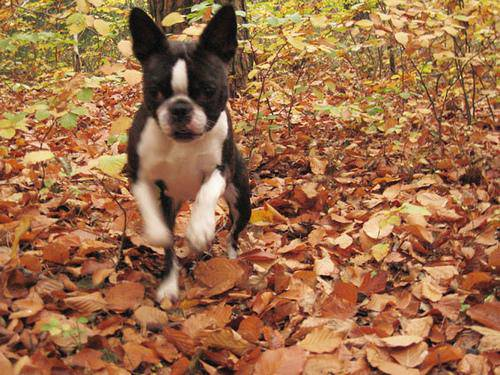

In [7]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog_Breed/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

# Getting images and their labels
### Let's get a list of our image file pathnames.

In [8]:
# for loop to create a list
filenames = ["drive/MyDrive/Dog_Breed/dog-breed-identification/train/"+fname + ".jpg" for fname in labels_csv["id"]]
filenames[:3]

['drive/MyDrive/Dog_Breed/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg']

In [9]:
# Check whether the number of filenames match the number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog_Breed/dog-breed-identification/train/")) == len(filenames):
  print("Proceed further")
else:
  print("Check the target directory")

Proceed further


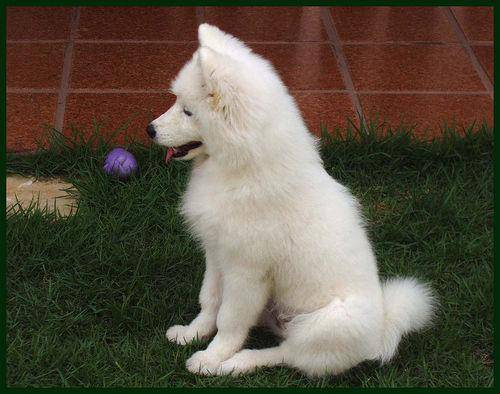

In [10]:
# Accessing images through the list we created ( way easier than writing complete links)
Image(filenames[9999])

In [11]:
labels_csv["breed"][9999]

'samoyed'

In [12]:
# Let's prepare our labels
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels[:10]
# Here we made a list of our breeds

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [13]:
print(type(labels))

<class 'numpy.ndarray'>


In [14]:
# Check if number of labels match the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels do not match number of filenames!")

Number of labels matches number of filenames!


In [15]:
# Find the number of unique values of labels
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [16]:
# Turn a string into an array of booleans
print(labels[0])
labels[0] == unique_breeds
# We are checking for boston bull and it is only true in one case

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
 # Turn every label into a boolean array
 boolean_labels = [label == unique_breeds for label in labels]
 boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

In [19]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

# Creating our own Validation Set
## Creating x and y as feature variables and target respectively

In [21]:
X = filenames
y = boolean_labels


In [22]:
len(filenames)

10222

We're going to start off experimenting 1000 images (subsample) and then build up from there

In [23]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000}

In [24]:
# Let's split data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size = NUM_IMAGES
X_train, X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

## Preprocessing images (turning images into tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it as variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image
5. Resize the `image` to be (224,224)
6. Return the modified `image`

In [25]:
# Before that, let's convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [26]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [27]:
# Now let's write the function
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path,img_size = IMG_SIZE):
  '''Takes an image file path and turns the image into a Tensor'''
  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into Tensor with 3 Colour channels (RGB)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values and normalize them
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value
  image = tf.image.resize(image,size = [IMG_SIZE,IMG_SIZE])

  return image

# Turning our data into minibatches
Why turn into batches?
Let's say if you are trying to process 10,000+ images in one go they might not fit into memory so we break them down
So that's why we do about 32 images at one time
* In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like : (`image,label)`

In [28]:
# Create a simple function to create a function of tuples
def get_image_label(image_path,label):
  '''Takes an image file path name, processes it and returns a tuple of image and label.'''
  image = process_image(image_path)
  return image,label

In [29]:
# Demo of the above function
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form : `(image,label)`, let's make it into batches

In [30]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [31]:
# Creating training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [32]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [33]:
# Visualizing Data Batches
import matplotlib.pyplot as plt
# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  '''
  Displays a plot of 25 images and their labels from a data batch
  '''
  #Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    #Create subplots (5 rows and 5 columns)
    ax = plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    # Add the image label as a title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off') #To turn the grid lines off

In [34]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

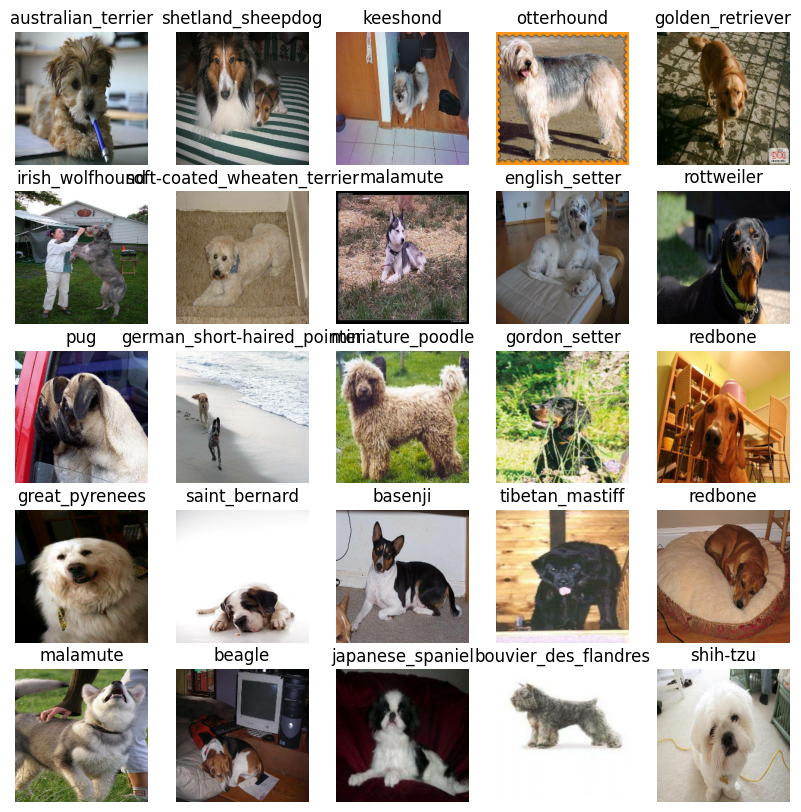

In [35]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

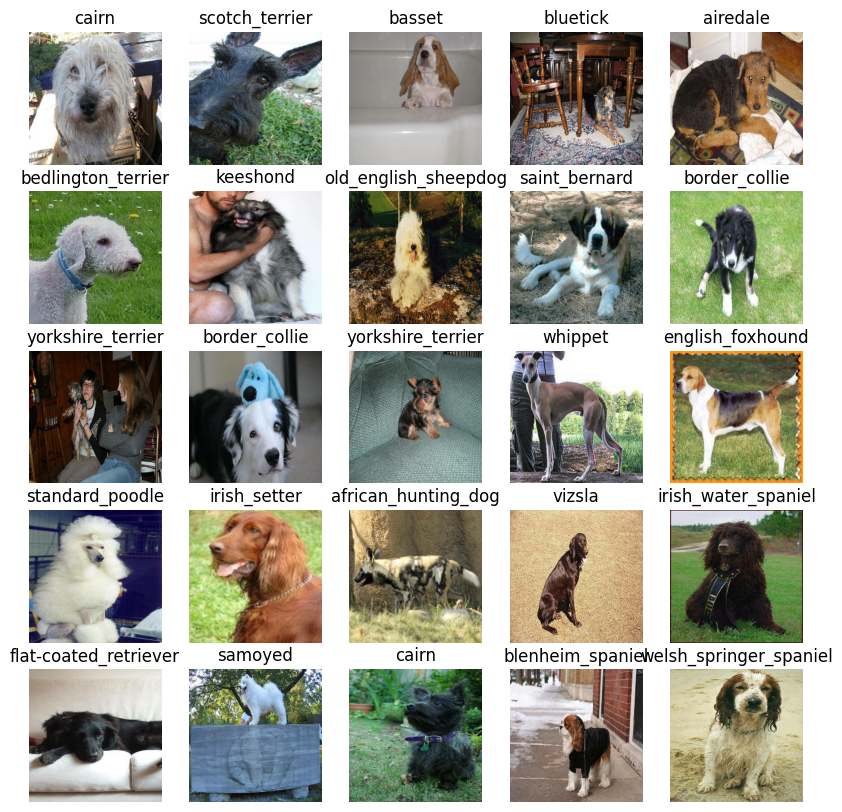

In [36]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model
Before we build a model, there are a few things we need to define,

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The url of the model we want the use.

In [37]:
# Setup input shape to the model
INPUT_SHAPE =  [None,IMG_SIZE,IMG_SIZE,3]  # batch,height,width,colour channels

# Setup the output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model url from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [38]:
# Create a function that builds a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with: ",MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL),tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")])

  # Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),optimizer=tf.keras.optimizers.Adam(),metrics=['accuracy'])

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [39]:
model= create_model(MODEL_URL)
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


#Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

#TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [40]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [41]:
import datetime

# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog_Breed/dog-breed-identification/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

#Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [42]:
# Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",patience=3)

#Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [43]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [44]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


#Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for `(NUM_EPOCHS)` and the callbacks we'd like to use
* Return the model

In [45]:
# Let's create a function that trains a model
def train_model():
  '''
  Trains a given model and returns the trained version
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard Session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it callbacks we created
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])

  # Return the fitted model
  return model

In [46]:
# Fit the model to data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 16s 270ms/step - loss: 4.6818 - accuracy: 0.0862 - val_loss: 3.5058 - val_accuracy: 0.1950
Epoch 2/100
25/25 [==============================] - 3s 120ms/step - loss: 1.6961 - accuracy: 0.6650 - val_loss: 2.1755 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 3s 117ms/step - loss: 0.5896 - accuracy: 0.9287 - val_loss: 1.6542 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 4s 162ms/step - loss: 0.2688 - accuracy: 0.9800 - val_loss: 1.5122 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 3s 127ms/step - loss: 0.1544 - accuracy: 0.9912 - val_loss: 1.4350 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1044 - accuracy: 1.0000 - val_loss: 1.3834 - val_accuracy: 0.6400
Epoch 7/100
25/25 [============================

### Checking the TensorBoard Logs

In [47]:
%tensorboard --logdir drive/MyDrive/Dog_Breed/dog-breed-identification/logs

<IPython.core.display.Javascript object>

# Making and evaluating predictions using a trained model

In [48]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [49]:
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 92ms/step


array([[1.0737054e-03, 2.2618762e-05, 2.2215436e-03, ..., 1.9716831e-04,
        5.5021472e-05, 1.0197872e-03],
       [4.6641432e-04, 4.7371181e-04, 1.6894378e-02, ..., 1.3820281e-04,
        3.5775548e-03, 1.2539963e-04],
       [2.2456505e-05, 2.2696784e-05, 2.0320949e-05, ..., 1.1643738e-05,
        6.7075571e-06, 2.6259935e-04],
       ...,
       [1.4819424e-06, 2.6965436e-05, 1.7706607e-05, ..., 2.1693686e-06,
        3.0984738e-05, 7.1128932e-05],
       [1.1850604e-03, 4.6341316e-05, 9.2245820e-05, ..., 1.0152374e-04,
        9.5234755e-05, 1.3999722e-02],
       [1.6252031e-03, 6.2931947e-05, 7.8261463e-04, ..., 3.3174211e-03,
        3.4567624e-04, 6.7091081e-05]], dtype=float32)

In [50]:
predictions.shape

(200, 120)

In [51]:
len(y_val)

200

In [52]:
len(unique_breeds)

120

In [53]:
predictions[0].sum() # Total probabilities almost equal to 1

1.0

In [54]:
# First Prediction
index=0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.0737054e-03 2.2618762e-05 2.2215436e-03 9.8183329e-05 1.1981152e-03
 2.7265358e-05 1.5713919e-02 1.0916726e-03 5.4443453e-04 1.0077204e-03
 1.7539155e-03 2.0017405e-04 2.7379525e-04 1.5467958e-04 2.1376644e-04
 1.4087121e-03 2.3378206e-04 2.9502514e-01 3.3696011e-05 6.3098429e-05
 8.7292510e-04 7.2747083e-05 3.6947276e-05 7.5401780e-03 3.3482382e-04
 1.2591346e-03 1.2971537e-01 5.6118606e-05 1.3862909e-03 5.4188022e-05
 5.4055144e-04 5.6286424e-04 4.6291697e-04 4.3528511e-05 2.6050766e-04
 9.8627463e-02 2.3210689e-05 3.6803342e-04 2.1291498e-04 4.1362460e-04
 1.9648187e-04 2.6046368e-04 1.0493613e-05 1.0021420e-04 2.6338734e-05
 1.8260104e-04 1.4285380e-05 1.2190015e-04 1.2028693e-03 2.0390969e-04
 2.4692636e-04 3.4802459e-05 5.1298295e-04 4.9280043e-06 3.0802817e-05
 3.2411070e-05 2.2526145e-04 3.2213037e-03 9.9278986e-04 3.6411986e-02
 8.5797906e-04 1.2104487e-04 2.2271310e-03 2.4997440e-05 3.9393260e-04
 1.9076876e-02 2.4976535e-04 2.9106718e-04 1.0773302e-03 1.5949605e-04
 4.393

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [55]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probabailities
pred_label=get_pred_label(predictions[81])
pred_label

'dingo'

Since our val_data is in batches, we need to unbatch it to make predictions on the validation dataset and compare them on the truth labels.

In [56]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batch dataset of (image,label) Tensors and returns separate arrays of images and labels
  '''
  images = []
  labels = []
  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

# Unbatchify the val_data
val_images, val_labels = unbatchify(val_data)
val_images[0],val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [57]:
images_ = []
labels_ = []

# Loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images
Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [58]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:.2f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

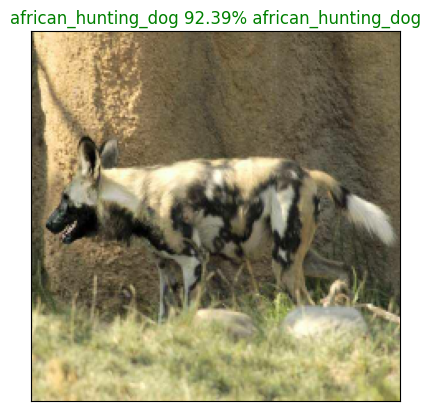

In [59]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=17)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
    * Prediction probabilities indexes ✅
    * Prediction probabilities values ✅
    * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [60]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  '''
  Plot the top 10 highest predictions confidences along with the truth label for sample n
  '''
  pred_prob, true_label = prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),labels = top_10_pred_labels, rotation='vertical')

  # Change the value of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

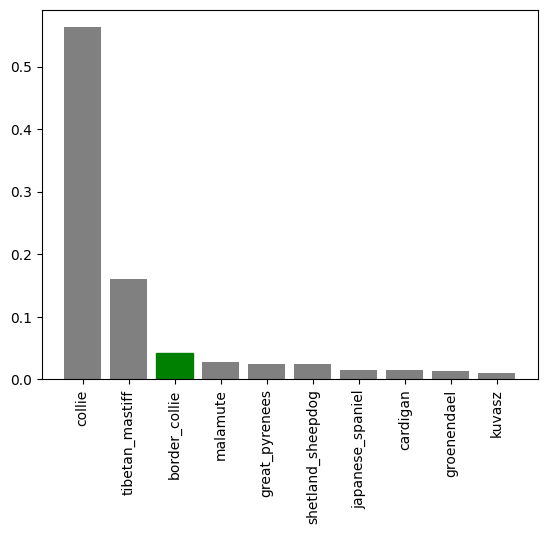

In [61]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

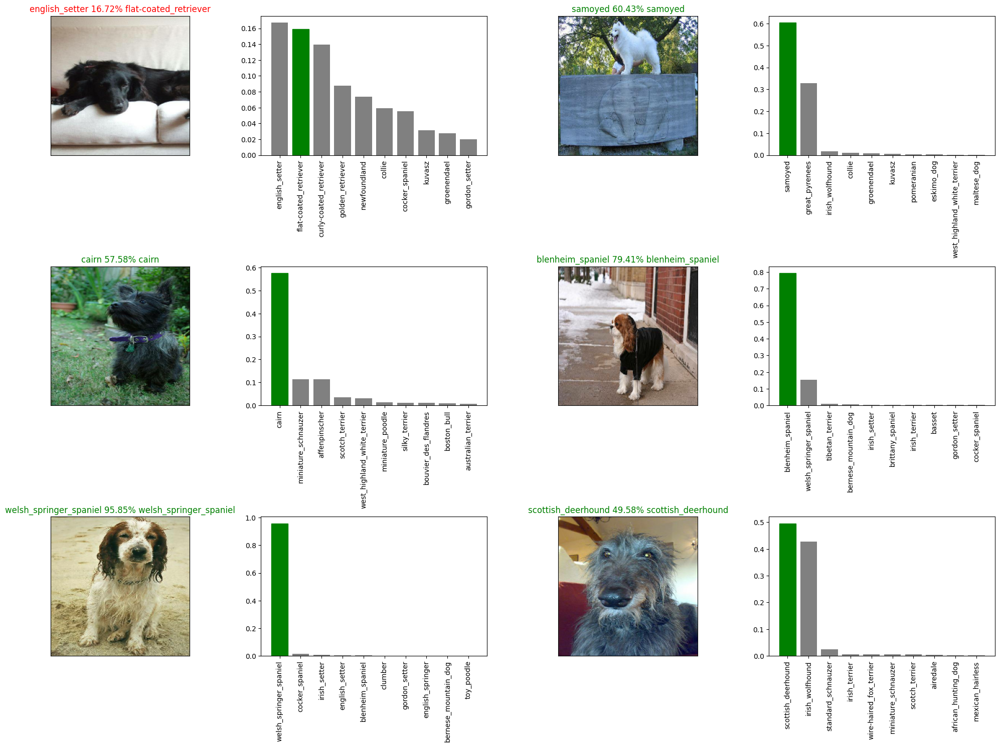

In [62]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and reloading a trained model

In [63]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog_Breed/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [64]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [65]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog_Breed/dog-breed-identification/models/20230711-23491689119369-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog_Breed/dog-breed-identification/models/20230711-23491689119369-1000-images-mobilenetv2-Adam.h5'

In [66]:
# Load a trained model
load_1000_image_model = load_model('drive/MyDrive/Dog_Breed/dog-breed-identification/models/20230704-23011688511688-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog_Breed/dog-breed-identification/models/20230704-23011688511688-1000-images-mobilenetv2-Adam.h5


In [67]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 83ms/step - loss: 1.2455 - accuracy: 0.6750


[1.2455159425735474, 0.675000011920929]

In [68]:
# Evaluate the saved and loaded model
load_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 129ms/step - loss: 1.2739 - accuracy: 0.6850


[1.2738962173461914, 0.6850000023841858]

# Training the model on complete data




In [69]:
len(X),len(y)

(10222, 10222)

In [70]:
# Create a data batch with a full dataset
full_data = create_data_batches(X,y)

Creating training data batches...


In [71]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [72]:
# Create a model for full data
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [73]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set on training on all the data
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)

In [74]:
# Fit the full model to the full data
full_model.fit(x=full_data,epochs = NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 111ms/step - loss: 1.3332 - accuracy: 0.6693
Epoch 2/100
320/320 [==============================] - 35s 109ms/step - loss: 0.3968 - accuracy: 0.8832
Epoch 3/100
320/320 [==============================] - 35s 109ms/step - loss: 0.2344 - accuracy: 0.9364
Epoch 4/100
320/320 [==============================] - 33s 103ms/step - loss: 0.1509 - accuracy: 0.9649
Epoch 5/100
320/320 [==============================] - 35s 111ms/step - loss: 0.1050 - accuracy: 0.9789
Epoch 6/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0765 - accuracy: 0.9878
Epoch 7/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0574 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0468 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0391 - accuracy: 0.9951
Epoch 10/100
320/320 [==============================] - 35s 108m

In [75]:
  save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog_Breed/dog-breed-identification/models/20230711-23591689119981-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog_Breed/dog-breed-identification/models/20230711-23591689119981-full-image-set-mobilenetv2-Adam.h5'

In [76]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog_Breed/dog-breed-identification/models/20230705-01291688520588-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog_Breed/dog-breed-identification/models/20230705-01291688520588-full-image-set-mobilenetv2-Adam.h5


# Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [77]:
# Load test image filenames
test_path = "drive/MyDrive/Dog_Breed/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog_Breed/dog-breed-identification/test/e527455253416f809a73886b6003020d.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/test/deed28298a869f87cf0372f592a21d43.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/test/df624595296500c98e3a1bf4d9ea917b.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/test/e34654831e228ad3ac1d0c463e70caf6.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/test/de291f05facd9c7db8d4880a0c84263b.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/test/df8d6d05e6f83c513a4ab0077207a72a.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/test/e2628b6bde028b5eb593616128728907.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/test/e190bfb63cf9a7cf1b3ae2ea654a735b.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/test/e3a7aeb038b8abd3f8ed910c84504efc.jpg',
 'drive/MyDrive/Dog_Breed/dog-breed-identification/test/dcab2d03a686ab3f31d1bc3e5700f6d1.jpg']

In [78]:
len(test_filenames)

10357

In [79]:
# Create test data batches
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [80]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [81]:
# Make predictions on test data batch using full loaded model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 41s 126ms/step


In [82]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog_Breed/preds_array.csv", test_predictions, delimiter=",")

In [83]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog_Breed/preds_array.csv", delimiter=",")

In [91]:
# Making predictions on custom images
custom_path =  "drive/MyDrive/Dog_Breed/Predicting_images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [92]:
custom_image_paths

['drive/MyDrive/Dog_Breed/Predicting_images/testcustom1.jpg']

In [93]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [94]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 517ms/step


In [95]:
custom_preds

array([[1.53539941e-11, 5.04755881e-05, 3.83780518e-09, 3.13031129e-10,
        1.69796888e-09, 1.75463283e-10, 8.14878113e-13, 1.03906872e-09,
        1.69107188e-05, 1.26299116e-09, 4.09100913e-08, 2.99673758e-07,
        8.69247799e-07, 1.97448207e-05, 4.91123819e-06, 2.84785386e-07,
        1.98126848e-09, 4.60176369e-10, 1.41233002e-04, 1.10871208e-10,
        1.54251834e-10, 2.09565129e-10, 2.17074327e-11, 2.75150729e-08,
        4.33832520e-06, 6.37139630e-09, 3.37034756e-09, 4.98224146e-08,
        4.11445762e-06, 3.89495464e-10, 1.24939403e-09, 6.61373679e-06,
        1.01901044e-03, 3.06844549e-06, 5.38604965e-08, 2.38536927e-07,
        2.15763230e-08, 1.92449856e-09, 3.14774140e-09, 1.81143562e-07,
        1.03152764e-03, 6.44143938e-08, 1.37544340e-08, 3.03660252e-09,
        2.60902365e-04, 6.12420337e-09, 1.83543708e-10, 4.82156981e-09,
        1.15588789e-10, 9.53443766e-01, 2.07301309e-06, 8.89963246e-07,
        2.12400937e-06, 3.37898554e-09, 1.08824116e-09, 1.014510

In [96]:
custom_preds.shape

(1, 120)

In [97]:
len(custom_preds)

1

In [98]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever']

In [99]:
# Get custom images
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

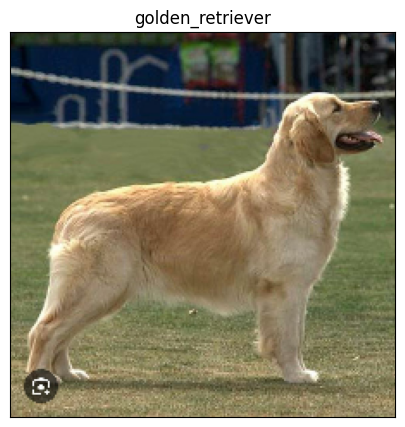

In [100]:
# Check custom image predictions
plt.figure(figsize=(10,5))
for i,image in enumerate(custom_images):
  plt.subplot(1,1,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)